In [1]:
import json

# Example current format data
with open('alphapose-results-severe (1).json','rb') as fh:
    data = json.load(fh)
data

[{'image_id': '0.jpg',
  'category_id': 1,
  'keypoints': [271.24664306640625,
   702.9429931640625,
   0.02792099304497242,
   190.97596740722656,
   444.29296875,
   0.035121794790029526,
   298.0035400390625,
   542.401611328125,
   0.05058315396308899,
   494.2207946777344,
   586.9963989257812,
   0.1159680187702179,
   226.65182495117188,
   524.5636596679688,
   0.06362458318471909,
   752.8707885742188,
   720.7808837890625,
   0.046362537890672684,
   262.32769775390625,
   533.4826049804688,
   0.08060729503631592,
   574.491455078125,
   1264.8377685546875,
   0.36436358094215393,
   547.734619140625,
   1264.8377685546875,
   0.21931315958499908,
   387.1932067871094,
   925.9171142578125,
   0.14256776869297028,
   360.4363098144531,
   881.322265625,
   0.5173807144165039,
   743.9518432617188,
   783.213623046875,
   0.02307523414492607,
   440.7070007324219,
   997.268798828125,
   0.06372043490409851,
   503.1397705078125,
   533.4826049804688,
   0.07686272263526917,


In [2]:

# Initialize MMSkeleton format
mmskeleton_data = {
    "data": {
        "keypoint": []
    },
    "frame_dir": "video_name",  # Set video name here
    "img_shape": [720, 1280],  # Example: height and width of the video
    "original_shape": [720, 1280],
    "total_frames": len(data)
}


In [3]:
bounding = []
# Process each frame and extract keypoints
for frame_data in data:
    keypoints = frame_data["keypoints"]
    frame_keypoints = []
    # Group keypoints in sets of 3 (x, y, confidence)
    for i in range(0, len(keypoints), 3):
        frame_keypoints.append([keypoints[i], keypoints[i + 1], keypoints[i + 2]])
    # Append to the keypoint list in MMSkeleton format
    mmskeleton_data["data"]["keypoint"].append([frame_keypoints])
    bounding.append(frame_data["box"])

# Example label for the video, adjust accordingly
mmskeleton_data["data"]["label"] = 0

# Convert to JSON
json_data = json.dumps(mmskeleton_data, indent=4)
print(json_data)
print(bounding)

{
    "data": {
        "keypoint": [
            [
                [
                    [
                        271.24664306640625,
                        702.9429931640625,
                        0.02792099304497242
                    ],
                    [
                        190.97596740722656,
                        444.29296875,
                        0.035121794790029526
                    ],
                    [
                        298.0035400390625,
                        542.401611328125,
                        0.05058315396308899
                    ],
                    [
                        494.2207946777344,
                        586.9963989257812,
                        0.1159680187702179
                    ],
                    [
                        226.65182495117188,
                        524.5636596679688,
                        0.06362458318471909
                    ],
                    [
                        752.87078857

In [4]:
json_data = json.loads(json_data)

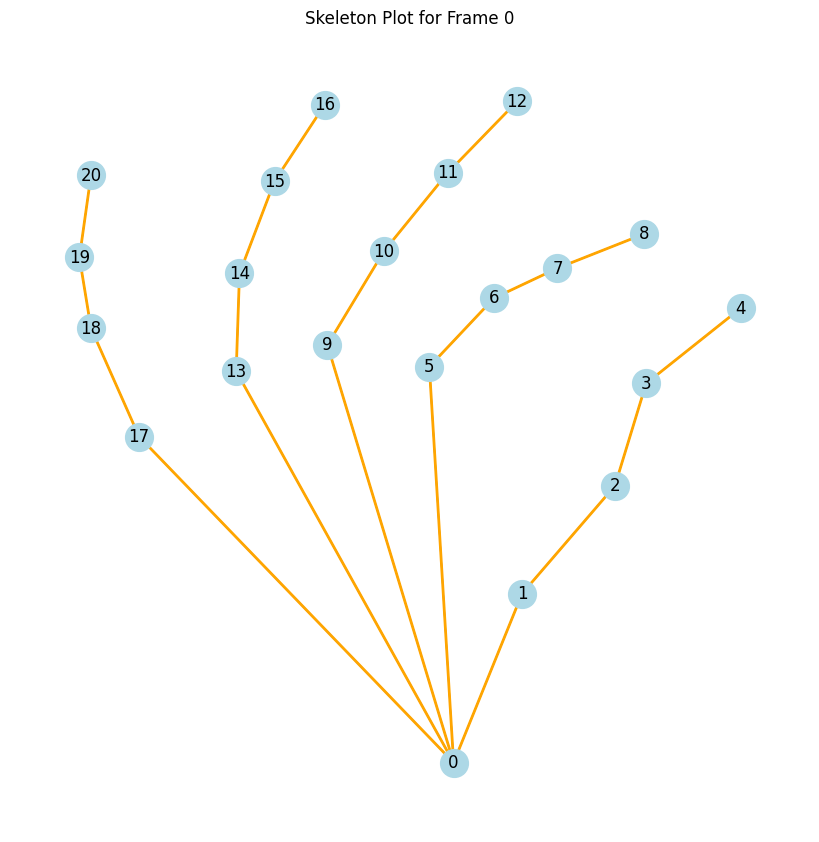

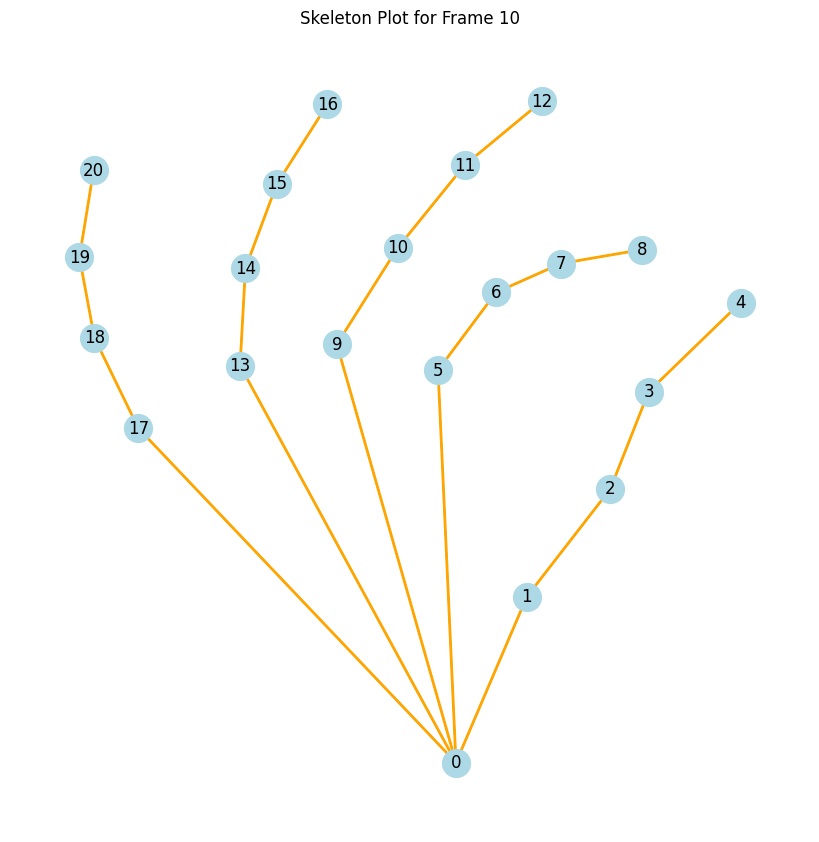

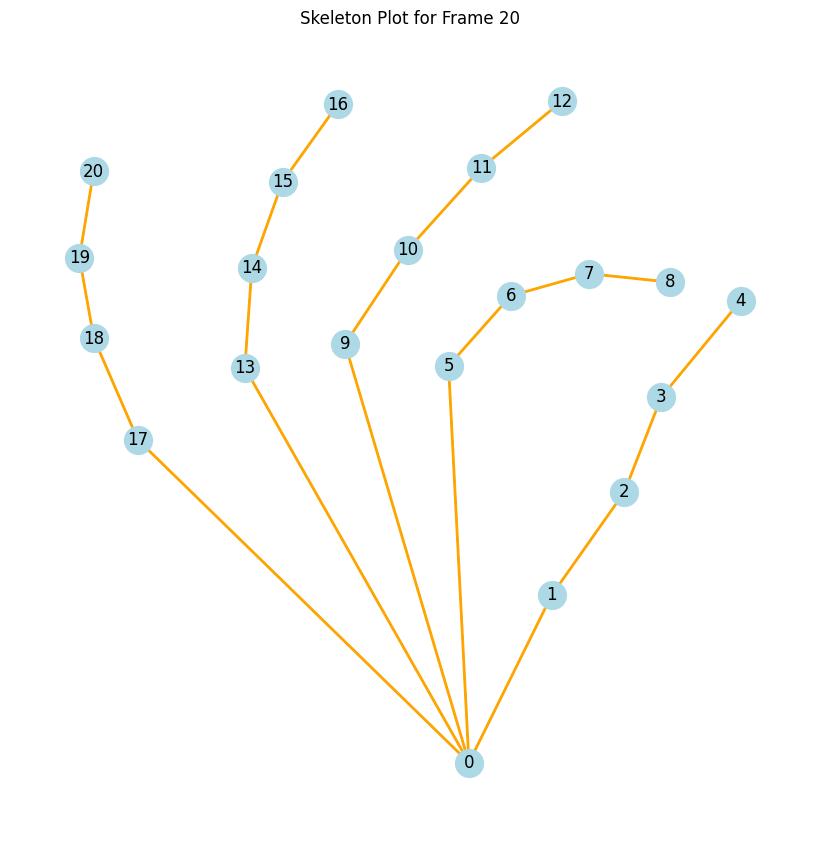

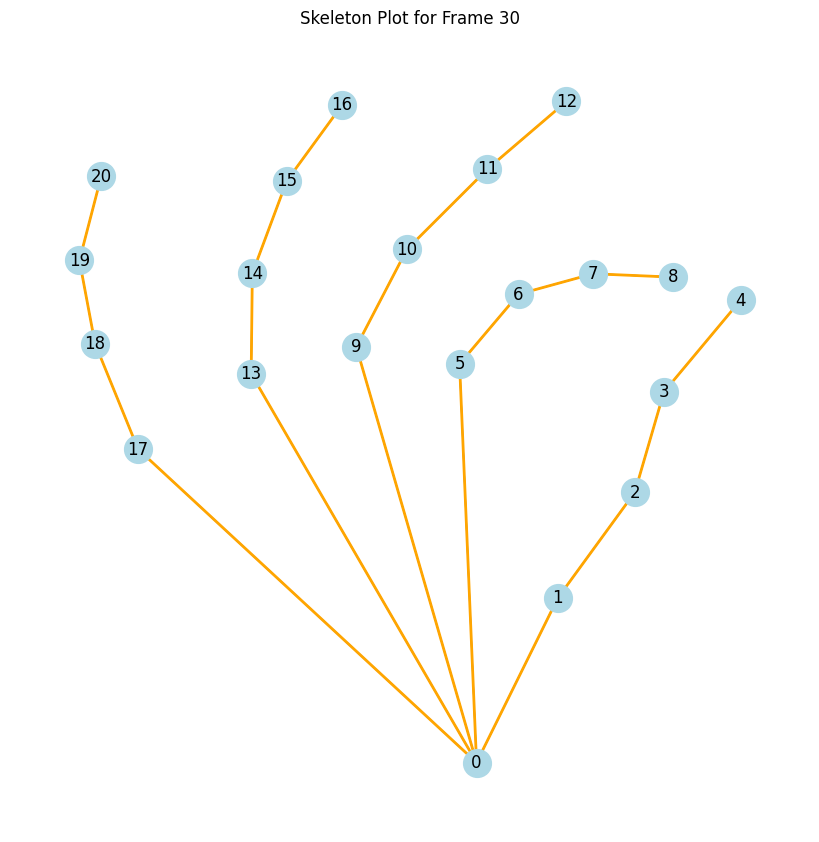

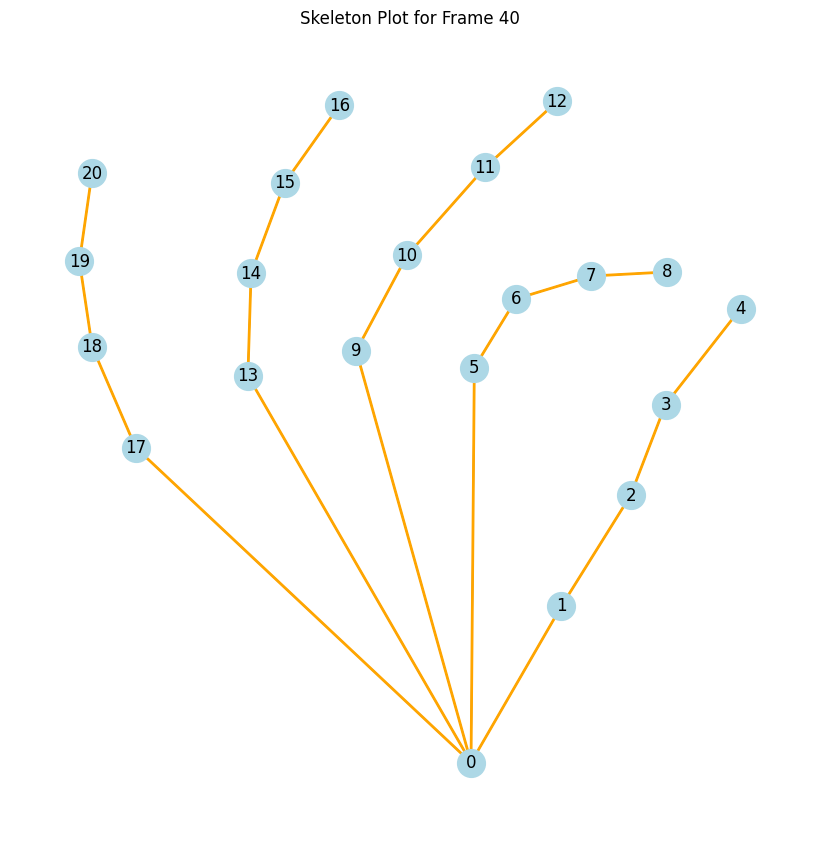

...

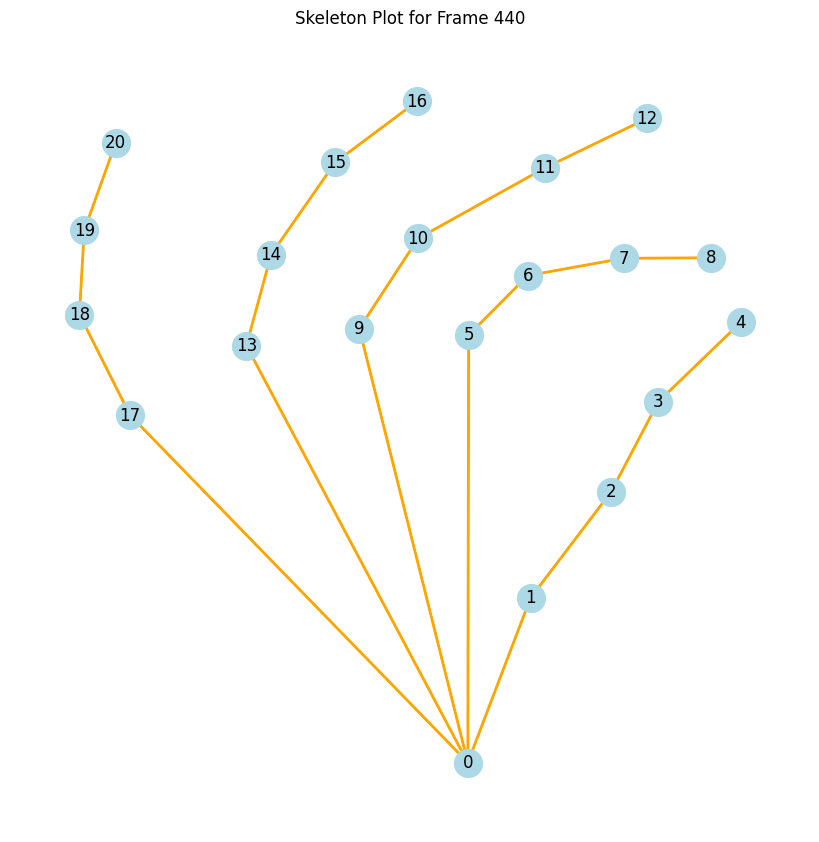

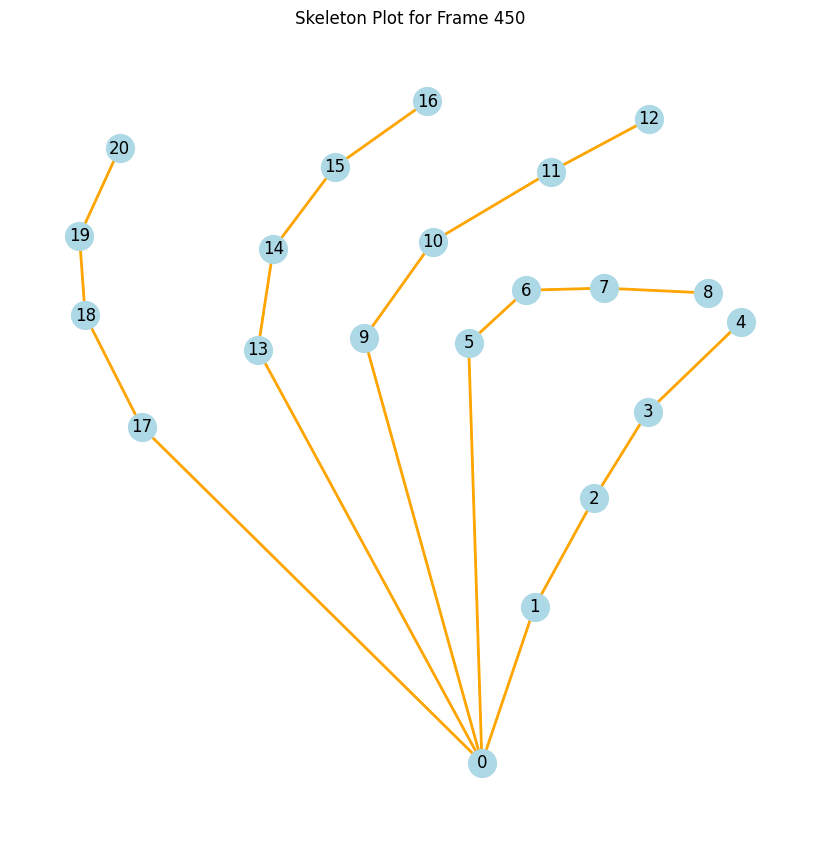

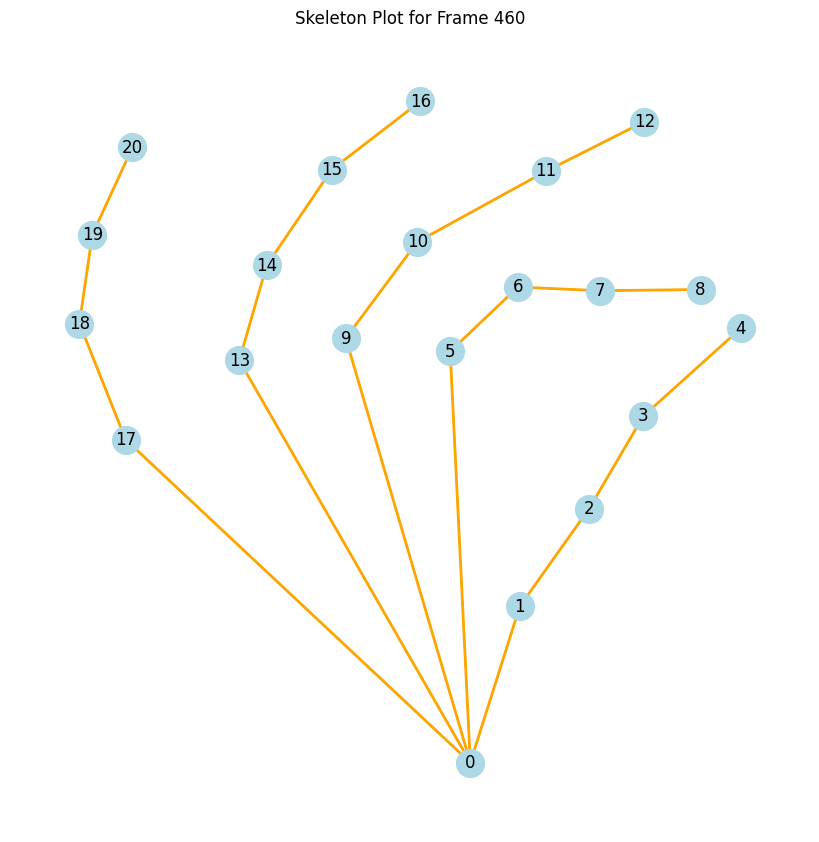

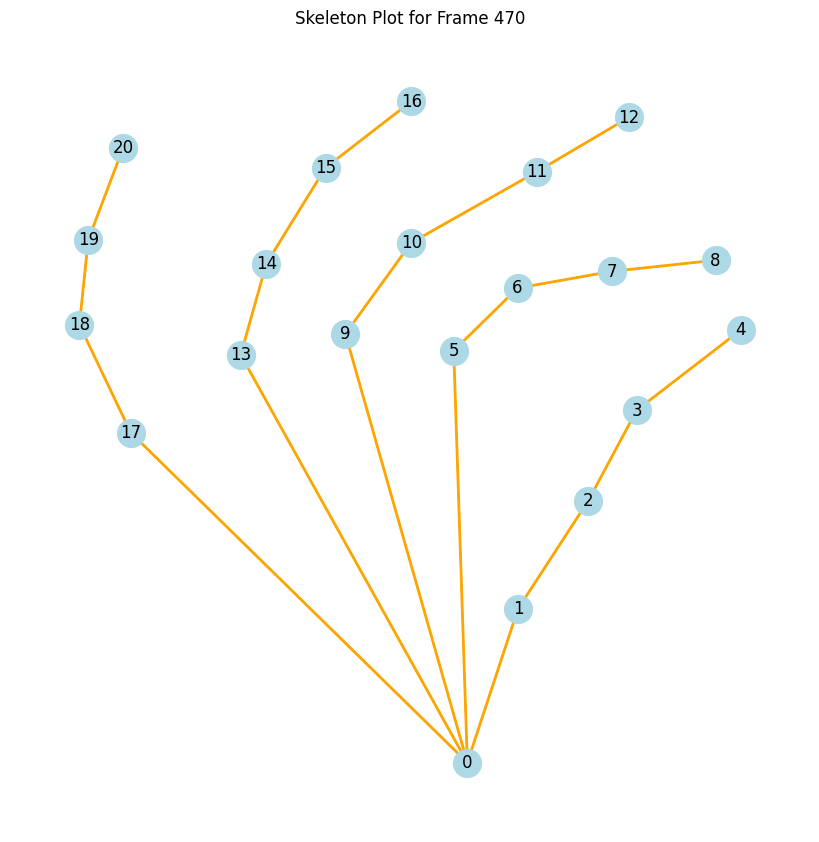

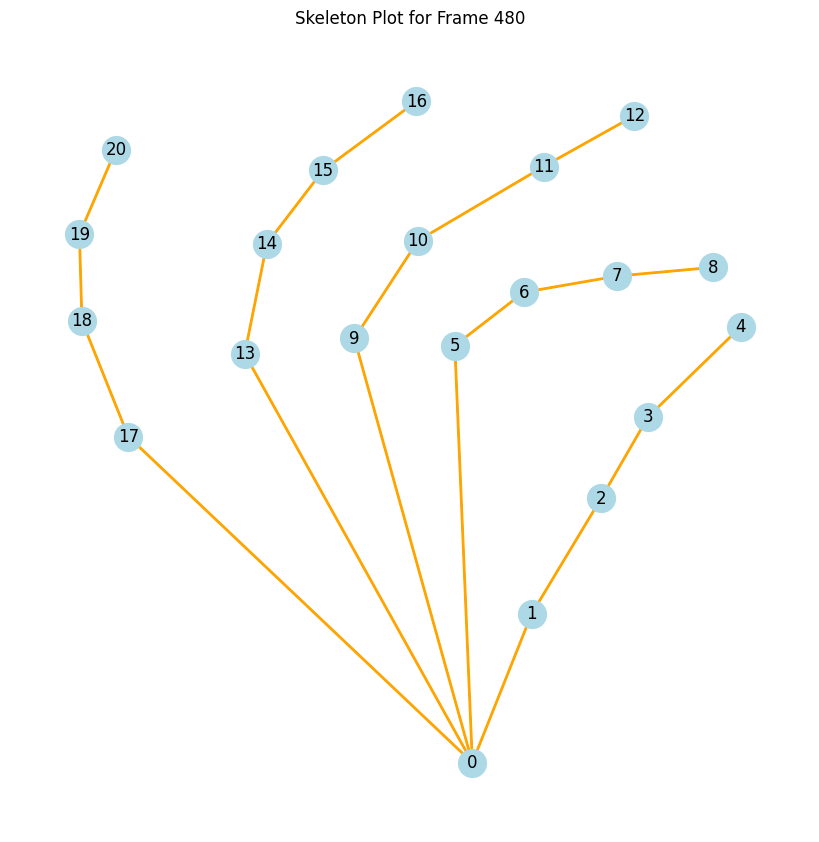

In [5]:
import json
import matplotlib.pyplot as plt
import networkx as nx

""" skeleton_edges = [
    (47, 48), (48, 49), (49, 50), (50, 51), 
    (47, 52), (52, 53), (53, 54), (54, 55),
    (47, 56), (56, 57), (57, 58), (58, 59),
    (47, 60), (60, 61), (61, 62), (62, 63),
    (47, 64), (64, 65), (65, 66), (66, 67),
] """
skeleton_edges = [
    (0, 1), (18, 17), (18, 19), (18, 25), (19, 20), (20, 21), 
    (0, 13), (13, 14), (14, 15), (15, 16),
    (0, 9), (9, 10), (10, 11), (11, 12),
    (0, 5), (5, 6), (6, 7), (7, 8),
    (0, 17), (1, 2), (2, 3), (3, 4),
]
hand_parts = [47, 64, 65, 66, 67, 60, 61, 62, 63, 56, 57, 58, 59, 52, 53, 54, 55, 48, 49, 50, 51]

""" skeleton_edges = [
    (15, 27), (27, 28), (28, 29), (29, 30), 
    (15, 31), (31, 32), (32, 33), (33, 34),
    (15, 35), (35, 36), (36, 37), (37, 38),
    (15, 39), (39, 40), (40, 41), (41, 42),
    (15, 43), (43, 44), (44, 45), (45, 46),
] """
frames = json_data["data"]["keypoint"]
main_kp = []
# Iterate through frames and plot every 20th frame
for frame_index in range(len(frames)):
        if frame_index % 10 == 0:
            frame_keypoints = frames[frame_index][0]  # Get keypoints for the current frame

            # Extract (x, y) positions, ignoring confidence scores
            keypoints = [(frame_keypoints[kp][0], frame_keypoints[kp][1]) for kp in range(len(frame_keypoints)) if kp in hand_parts]
            main_kp.append(keypoints)
            # Create a graph to plot keypoints and connections
            G = nx.Graph()
            for idx, (x, y) in enumerate(keypoints):
                G.add_node(idx, pos=(x, y))

            # Add edges based on the skeleton structure
            for edge in skeleton_edges:
                if edge[0] < len(keypoints) and edge[1] < len(keypoints):  # Check if keypoints exist
                    G.add_edge(edge[0], edge[1])

            # Plotting
            plt.figure(figsize=(8, 8))
            pos = nx.get_node_attributes(G, 'pos')
            nx.draw(G, pos, node_size=400, node_color='lightblue', with_labels=True)
            nx.draw_networkx_edges(G, pos, width=2, edge_color='orange')  # Draw edges
            plt.title(f"Skeleton Plot for Frame {frame_index}")
            plt.gca().invert_yaxis()
            plt.show()




In [6]:
main_kp

[[(377.8102722167969, 914.160888671875),
  (413.42437744140625, 784.5736083984375),
  (461.6457214355469, 701.9099731445312),
  (477.8883056640625, 623.4369506835938),
  (526.956787109375, 565.7667846679688),
  (365.2054443359375, 610.5650024414062),
  (398.8196716308594, 557.9634399414062),
  (431.7919921875, 535.0302734375),
  (476.7328796386719, 508.810791015625),
  (312.21746826171875, 593.885498046875),
  (341.5875549316406, 522.0424194335938),
  (374.70794677734375, 461.962646484375),
  (410.81573486328125, 407.135009765625),
  (264.8144836425781, 614.0179443359375),
  (266.532470703125, 539.0895385742188),
  (284.7424011230469, 468.3267517089844),
  (310.8372497558594, 409.6375427246094),
  (214.33489990234375, 664.1441650390625),
  (189.35687255859375, 581.0558471679688),
  (183.34124755859375, 526.761962890625),
  (189.3550262451172, 463.7701110839844)],
 [(379.4962463378906, 916.5266723632812),
  (415.8869323730469, 791.4073486328125),
  (458.7101135253906, 710.274169921875),

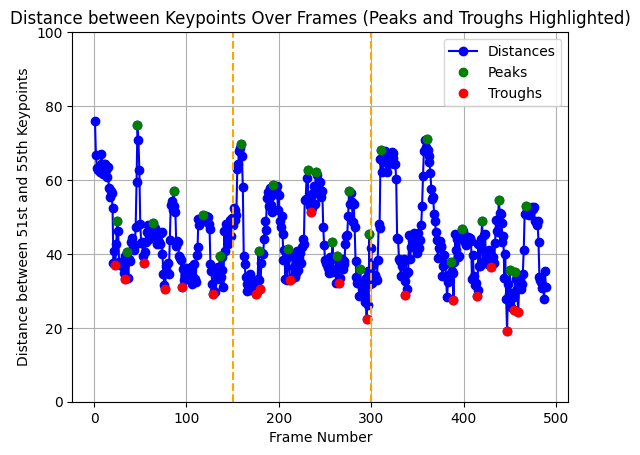

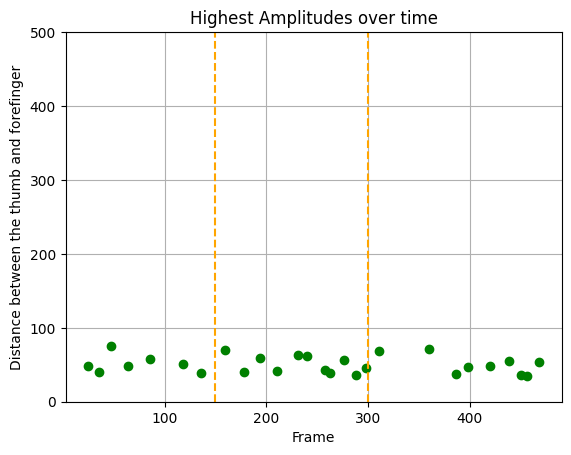

In [12]:
import json
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

# Assuming json_data is a string, we need to parse it
if isinstance(json_data, str):
    json_data = json.loads(json_data)

# Prepare a list to store distances for each frame
distances = []

# Get all frames from the JSON data
frames = json_data["data"]["keypoint"]

# Define the distance calculation function
def calculate_distance(x1, y1, x2, y2):
    return np.sqrt((x2 - x1) ** 2 + (y2 - y1) ** 2)

# Iterate through frames and calculate the distance for each
for frame_index in range(len(frames)):
    frame = frames[frame_index][0]
    
    # Extract (x55, y55, c55) and (x51, y51, c51) for the current frame
    x55, y55, c55 = frame[55]  # 55th keypoint (index 54)
    x51, y51, c51 = frame[51]  # 51st keypoint (index 50)
    
    # Calculate the distance between the 51st and 55th keypoints
    distance = calculate_distance(x55, y55, x51, y51)
    
    # Store the calculated distance
    distances.append(distance)

# Convert distances to a numpy array
distances_array = np.array(distances)

# Find only local maxima (peaks) and local minima (troughs) separately
peaks_indices, _ = find_peaks(distances_array, distance=5, prominence=7)  # Adjust prominence for clearer peak detection
troughs_indices, _ = find_peaks(-distances_array, distance=5, prominence=10)  # Detect troughs by finding peaks in the negative array

# Extract the highest points (distances) at the found peaks and lowest points at the troughs
highest_points = distances_array[peaks_indices]
lowest_points = distances_array[troughs_indices]

# Plot the distances and highlight only the peaks and troughs
fig, ax = plt.subplots()


ax.set_ylim(0, 100)
ax.plot(range(1, len(distances) + 1), distances_array, marker='o', color='blue', label='Distances')
ax.plot(peaks_indices + 1, highest_points, marker='o', color='green', linestyle='None', label='Peaks')
ax.plot(troughs_indices + 1, lowest_points, marker='o', color='red', linestyle='None', label='Troughs')
ax.set_xlabel("Frame Number")
ax.set_ylabel("Distance between 51st and 55th Keypoints")
ax.set_title("Distance between Keypoints Over Frames (Peaks and Troughs Highlighted)")
ax.legend()
plt.grid(True)
for i in [150, 300]:
    ax.axvline(x=i, color='orange', linestyle='--')

plt.show()


# Separate plot for the highest points (amplitudes over time)
figure, ax = plt.subplots()
ax.set_ylim(0, 500)
ax.plot(peaks_indices + 1, highest_points, marker='o', color='green', linestyle='None')
ax.set_xlabel("Frame")
ax.set_ylabel("Distance between the thumb and forefinger")
ax.set_title('Highest Amplitudes over time')
plt.grid(True)
for i in [150, 300]:
    ax.axvline(x=i, color='orange', linestyle='--')

plt.show()



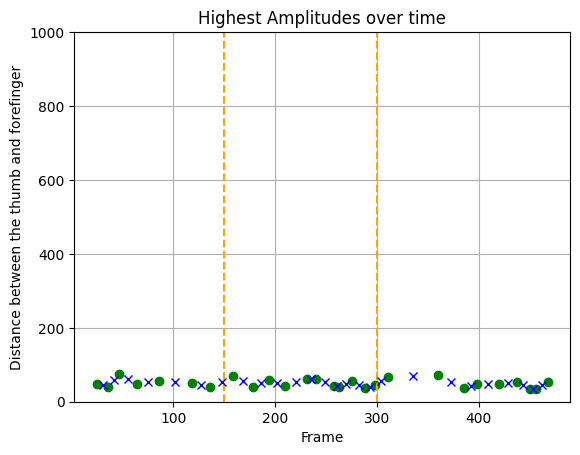

In [14]:
import json
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
from scipy.interpolate import interp1d

if isinstance(json_data, str):
    json_data = json.loads(json_data)

# Prepare a list to store distances for each frame
distances = []

# Get all frames from the JSON data
frames = json_data["data"]["keypoint"]

# Define the distance calculation function
def calculate_distance(x1, y1, x2, y2):
    return np.sqrt((x2 - x1) ** 2 + (y2 - y1) ** 2)

# Iterate through frames and calculate the distance for each
for frame_index in range(len(frames)):
    frame = frames[frame_index][0]
    
    # Extract (x55, y55, c55) and (x51, y51, c51) for the current frame
    x55, y55, c55 = frame[55]  # 55th keypoint (index 54)
    x51, y51, c51 = frame[51]  # 51st keypoint (index 50)
    
    # Calculate the distance between the 51st and 55th keypoints
    distance = calculate_distance(x55, y55, x51, y51)
    
    # Store the calculated distance
    distances.append(distance)

# Convert distances to a numpy array
distances_array = np.array(distances)

# Find only local maxima (peaks) and local minima (troughs) separately
peaks_indices, _ = find_peaks(distances_array, distance=5, prominence=7)  # Adjust prominence for clearer peak detection
troughs_indices, _ = find_peaks(-distances_array, distance=5, prominence=10)  # Detect troughs by finding peaks in the negative array

# Extract the highest points (distances) at the found peaks and lowest points at the troughs
highest_points = distances_array[peaks_indices]
lowest_points = distances_array[troughs_indices]


# Separate plot for the highest points (amplitudes over time)
figure, ax = plt.subplots()
ax.set_ylim(0, 1000)
ax.plot(peaks_indices + 1, highest_points, marker='o', color='green', linestyle='None')
ax.set_xlabel("Frame")
ax.set_ylabel("Distance between the thumb and forefinger")
ax.set_title('Highest Amplitudes over time')
plt.grid(True)
for i in [150, 300]:
    ax.axvline(x=i, color='orange', linestyle='--')

# Add one point between every two points
for i in range(len(peaks_indices) - 1):
    x_mid = (peaks_indices[i] + peaks_indices[i + 1]) / 2 + 1
    y_mid = (highest_points[i] + highest_points[i + 1]) / 2
    ax.plot(x_mid, y_mid, marker='x', color='blue', linestyle='None')


plt.show()



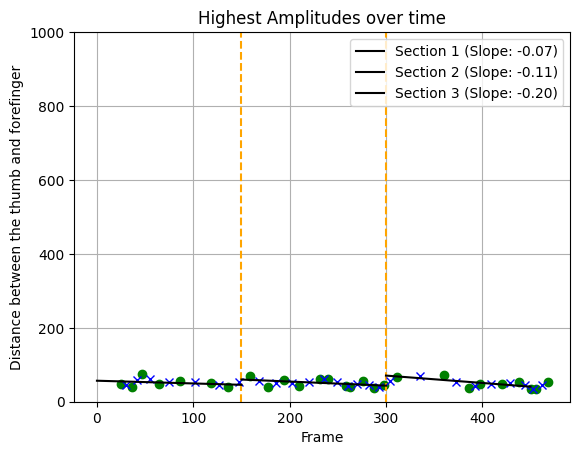

In [15]:
import json
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
from scipy.interpolate import interp1d

if isinstance(json_data, str):
    json_data = json.loads(json_data)

# Prepare a list to store distances for each frame
distances = []

# Get all frames from the JSON data
frames = json_data["data"]["keypoint"]

# Define the distance calculation function
def calculate_distance(x1, y1, x2, y2):
    return np.sqrt((x2 - x1) ** 2 + (y2 - y1) ** 2)

# Iterate through frames and calculate the distance for each
for frame_index in range(len(frames)):
    frame = frames[frame_index][0]
    
    # Extract (x55, y55, c55) and (x51, y51, c51) for the current frame
    x55, y55, c55 = frame[55]  # 55th keypoint (index 54)
    x51, y51, c51 = frame[51]  # 51st keypoint (index 50)
    
    # Calculate the distance between the 51st and 55th keypoints
    distance = calculate_distance(x55, y55, x51, y51)
    
    # Store the calculated distance
    distances.append(distance)

# Convert distances to a numpy array
distances_array = np.array(distances)

# Find only local maxima (peaks) and local minima (troughs) separately
peaks_indices, _ = find_peaks(distances_array, distance=5, prominence=7)  # Adjust prominence for clearer peak detection
troughs_indices, _ = find_peaks(-distances_array, distance=5, prominence=10)  # Detect troughs by finding peaks in the negative array

# Extract the highest points (distances) at the found peaks and lowest points at the troughs
highest_points = distances_array[peaks_indices]
lowest_points = distances_array[troughs_indices]


# Separate plot for the highest points (amplitudes over time)
figure, ax = plt.subplots()
ax.set_ylim(0, 1000)
ax.plot(peaks_indices + 1, highest_points, marker='o', color='green', linestyle='None')
ax.set_xlabel("Frame")
ax.set_ylabel("Distance between the thumb and forefinger")
ax.set_title('Highest Amplitudes over time')
plt.grid(True)
for i in [150, 300]:
    ax.axvline(x=i, color='orange', linestyle='--')

# Add one point between every two points
for i in range(len(peaks_indices) - 1):
    x_mid = (peaks_indices[i] + peaks_indices[i + 1]) / 2 + 1
    y_mid = (highest_points[i] + highest_points[i + 1]) / 2
    ax.plot(x_mid, y_mid, marker='x', color='blue', linestyle='None')

# Calculate regression lines for each section
sections = [(0, 150), (150, 300), (300, 450)]
colors = ['black', 'black', 'black']
for i, (start, end) in enumerate(sections):
    section_indices = [j for j, x in enumerate(peaks_indices + 1) if start <= x <= end]
    section_x = np.array([peaks_indices[j] + 1 for j in section_indices])
    section_y = np.array([highest_points[j] for j in section_indices])
    coeffs = np.polyfit(section_x, section_y, 1)
    slope = coeffs[0]  # slope is the first coefficient
    regression_line = np.poly1d(coeffs)
    x_range = np.linspace(start, end, 100)
    ax.plot(x_range, regression_line(x_range), color=colors[i], label=f'Section {i+1} (Slope: {slope:.2f})')

ax.legend()
plt.show()

